In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from pathlib import Path
import os


image_dir = Path("/home/elbasha/projects/imagecompression/image/")
output_dir = Path("/home/elbasha/projects/imagecompression/output")

output_dir.mkdir(parents=True, exist_ok=True)


MAX_SIZE = (512, 512)
QUALITY = 75

In [8]:
# Resize

def resize_image(img):
    return img.resize(MAX_SIZE, Image.LANCZOS).convert("RGB")

In [9]:
# Sharpen Function

def sharpen_image(img):
    return img.filter(
        ImageFilter.UnsharpMask(
            radius=1.5,
            percent=130,
            threshold=3
        )
    )

In [13]:
# Load Images

files = sorted(
    list(image_dir.glob("*.jpg")) +
    list(image_dir.glob("*.png"))
)[:10]

print(f"Working on {len(files)} images")

Working on 10 images


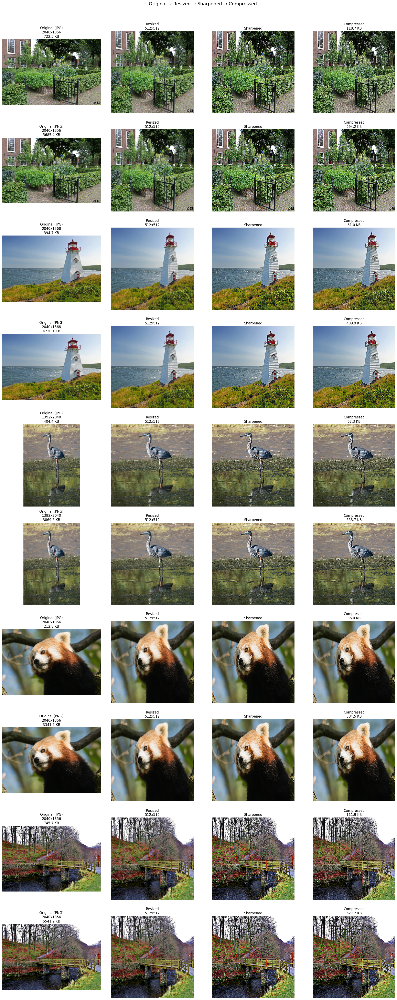

Done!


In [ ]:
# Create Figure

fig, axes = plt.subplots(
    len(files),
    4,
    figsize=(20, 5 * len(files))
)

# Fix single-image issue
if len(files) == 1:
    axes = [axes]

fig.suptitle(
    "Original → Resized → Sharpened → Compressed",
    fontsize=16
)

# Main Processing Loop

for i, src in enumerate(files):

    ext = src.suffix.lower().replace(".", "")
    name = src.stem

    out = output_dir / f"{name}_compressed.{ext}"

    # Original Image

    orig = Image.open(src)

    orig_size = os.path.getsize(src) / 1024

    # Resize

    resized = resize_image(orig)

    # Sharpen

    sharpened = sharpen_image(resized)

    # Compression Settings

    if ext == "jpg":
        save_kwargs = {
            "quality": QUALITY,
            "optimize": True
        }
    else:
        save_kwargs = {
            "optimize": True,
            "compress_level": 9
        }

    # Save Compressed Image

    sharpened.save(out, **save_kwargs)

    # Reload Compressed Image

    comp = Image.open(out)

    comp_size = os.path.getsize(out) / 1024

    # Plot Images

    # Original
    axes[i][0].imshow(orig)
    axes[i][0].set_title(
    f"Original ({ext.upper()})\n{orig.width}x{orig.height}\n{orig_size:.1f} KB")
    axes[i][0].axis("off")

    # Resized
    axes[i][1].imshow(resized)
    axes[i][1].set_title(
        f"Resized\n{MAX_SIZE[0]}x{MAX_SIZE[1]}"
    )
    axes[i][1].axis("off")

    # Sharpened
    axes[i][2].imshow(sharpened)
    axes[i][2].set_title("Sharpened")
    axes[i][2].axis("off")

    # Compressed
    axes[i][3].imshow(comp)
    axes[i][3].set_title(
        f"Compressed\n{comp_size:.1f} KB"
    )
    axes[i][3].axis("off")

# ==============================
# Final Layout

plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig(
    output_dir / "comparison.png",
    dpi=120,
    bbox_inches="tight"
)

plt.show()

print("Done!")